# Introduction to Geo-Visualization
## DATA 601: Fall 2019
### Usman Alim (ualim@ucalgary.ca)

Additional Resources:

In this notebook, we'll explore libraries that support geographic data visualization. In particular, we'll be looking at [`GeoPandas`](http://geopandas.org/) and its integration with [`matplotlib`](http://geopandas.org/mapping.html). [`Plotly`](https://plot.ly/python/maps/) also has geo-visualization capabilities that build upon the API provided by [`mapbox`](https://www.mapbox.com/).

## Topics

- Geo-visualization with `GeoPandas` and `matplotlib`<br>
<br>
- Interactive geo-visualization with `plotly` and `mapbox`<br>
  (You need to signup for a mapbox access token to use the mapbox API)


### A Quick Note about Map Projections

- The earth is usually approximated to have a spherical shape.
- The surfaces of a sphere is a 2-manifold and can be parametrized by a 2D coordinate system.
- The most familiar 2D coordinate system is the lat./long. coordinate system.
- Map projections use different kinds of projections to map the sphere to a plane. This will introduce (area, angle) distortions.

### Mercator Projection

- Default [projection](https://en.wikipedia.org/wiki/Web_Mercator_projection) used by many mapping software applications.

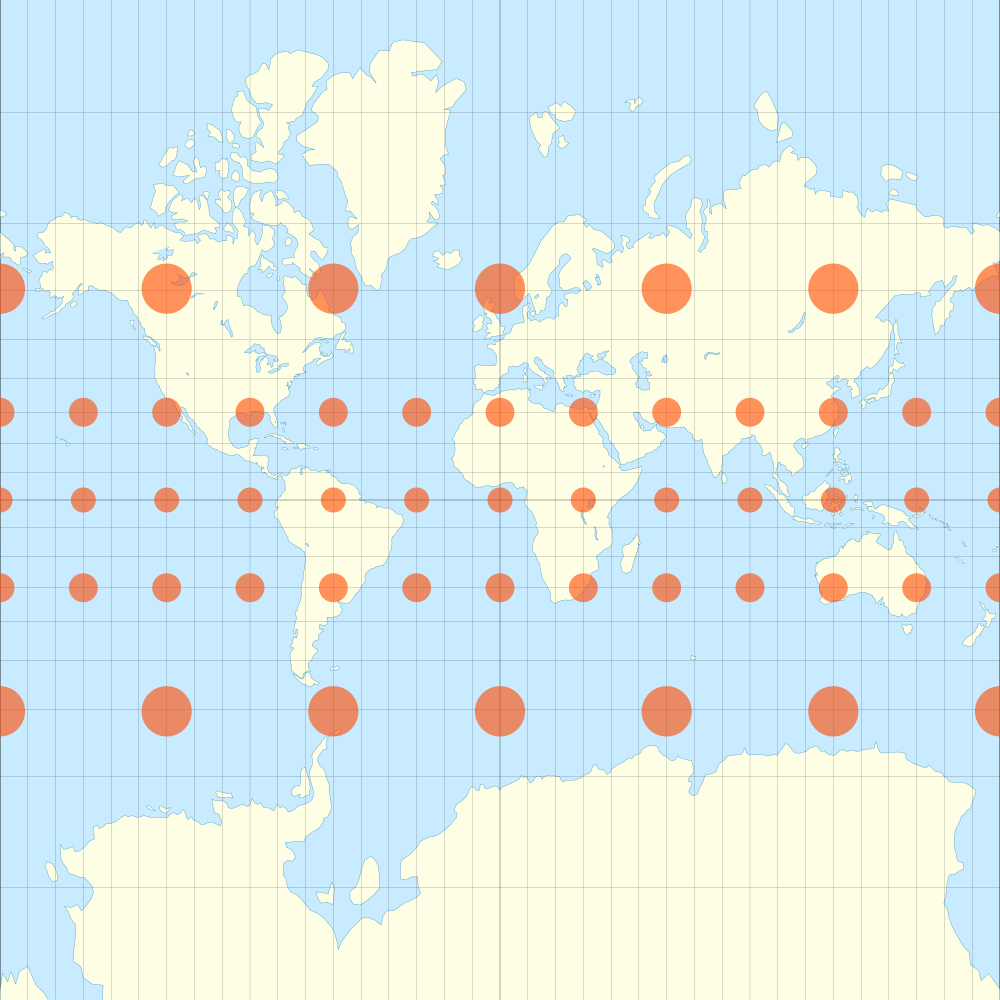


In [1]:
import numpy as np
import pandas as pd
import geopandas as gpd
import shapely.geometry as sg

import matplotlib as mpl
import matplotlib.pyplot as plt

import plotly as plotly
import plotly.offline as py
import plotly.graph_objs as go

py.init_notebook_mode(connected=True)


#%matplotlib inline
mpl.rcParams['figure.dpi']= 96
mpl.style.use('ggplot')

### GeoPandas

- Inherits from pandas. Provides the following two data structures: `GeoSeries` and `GeoDataFrame`.


- A `GeoSeries` is a `Series` where each entry describes a geeometric shape in _vector_ format. The following shapes are supported:<br>
  - Points / Multi-points
  - Lines / Multi-lines
  - Polygons / Multi-polygons
  
  
- A `GeoDataFrame` is a `pandas` `DataFrame` with a special 'geometry' column that contains a `GeoSeries`.


- Provides methods to convert between different geospatial coordinate systems. 


In [2]:
# Let's load some geographic data into a GeoDataFrame

census_file = './Census by Community 2019.geojson'
cendf = gpd.read_file(census_file)
display(cendf.head())
display(type(cendf))
display(cendf.describe())

# There's a geometry column which holds the geometric information as a GeoSeries
display(type(cendf.geometry))

,other_res,comm_structure,dup_occpd,mfh_owned,res_comm,name,twn_no_res,hotel_cnt,mul_no_res,apt_uc,...,mf_65_74,mul_na,other_75,oth_no_res,other_15_19,ownshp_cnt,oth_vacant,mfh_uc,prsch_chld,geometry
0,0.0,BUILDING OUT,343.0,0.0,0.0,LEGACY,2.0,0.0,0.0,2.0,...,252.0,0.0,0,0.0,0,1826.0,0.0,0.0,850.0,(POLYGON ((-114.021996041091 50.86307890478028...
1,1.0,1950s,354.0,0.0,2.0,HIGHLAND PARK,0.0,0.0,0.0,1.0,...,229.0,0.0,0,1.0,0,645.0,0.0,0.0,325.0,(POLYGON ((-114.0691626854784 51.0956503369408...
2,0.0,2000s,171.0,0.0,0.0,CORNERSTONE,0.0,0.0,0.0,219.0,...,118.0,0.0,0,0.0,0,708.0,0.0,0.0,199.0,(POLYGON ((-113.9183973202601 51.1760690262505...
3,1.0,1950s,497.0,0.0,5.0,MONTGOMERY,0.0,5.0,0.0,0.0,...,285.0,0.0,0,0.0,0,1027.0,5.0,0.0,328.0,(POLYGON ((-114.1645791808358 51.0814533789657...
4,1.0,1960s/1970s,570.0,0.0,0.0,TEMPLE,1.0,0.0,0.0,0.0,...,941.0,0.0,0,1.0,0,2460.0,0.0,0.0,908.0,(POLYGON ((-113.9351270614785 51.0960756546961...


geopandas.geodataframe.GeoDataFrame

,other_res,comm_structure,dup_occpd,mfh_owned,res_comm,name,twn_no_res,hotel_cnt,mul_no_res,apt_uc,...,mf_65_74,mul_na,other_75,oth_no_res,other_15_19,ownshp_cnt,oth_vacant,mfh_uc,prsch_chld,geometry
count,306,306,306,306,306,306,306,306,306,306,...,306,306,306,306,306,306,306,306,306,306
unique,7,12,137,10,13,306,8,12,3,22,...,185,2,1,6,7,195,10,2,171,306
top,0.0,1960s/1970s,0.0,0.0,0.0,COVENTRY HILLS,0.0,0.0,0.0,0.0,...,0.0,0.0,0,0.0,0,0.0,0.0,0.0,0.0,(POLYGON ((-114.082430302229 50.87040061424383...
freq,250,45,144,297,282,1,253,245,303,273,...,103,305,306,288,295,104,250,305,112,1


geopandas.geoseries.GeoSeries

In [3]:
# Let's index by community name
cendf.set_index('name', inplace=True)
cendf.memory_usage(index=True, deep=True).sum() / (1024 * 1024)

2.523667335510254

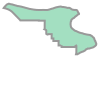

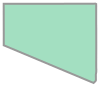

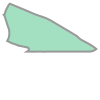

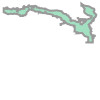

name
LEGACY           0.000777
HIGHLAND PARK    0.000176
CORNERSTONE      0.000988
MONTGOMERY       0.000379
TEMPLE           0.000337
dtype: float64

name
LEGACY           0.178019
HIGHLAND PARK    0.030965
CORNERSTONE      0.141467
MONTGOMERY       0.066120
TEMPLE           0.102240
dtype: float64

In [4]:
# Let's explore what the canvas looks like
# In other words, let's visualize the geometry. 
# We can do this via the integration between geopandas and matplotlib

# If we select a particular geometry cell, Jupyter will display it

display(cendf.loc['INGLEWOOD','geometry'], cendf.loc['ROCKY RIDGE', 'geometry'], 
        cendf.loc['VARSITY', 'geometry'], cendf.loc['FISH CREEK PARK','geometry'])

# Basic methods to compute areas and bounds are also provided.

# Area of the geometric entitites
display(cendf['geometry'].area.head())

# Euclidean distance to Downtown for all the communities 
display(cendf['geometry'].distance(cendf.loc['DOWNTOWN COMMERCIAL CORE', 'geometry']).head())


{'init': 'epsg:4326', 'no_defs': True}

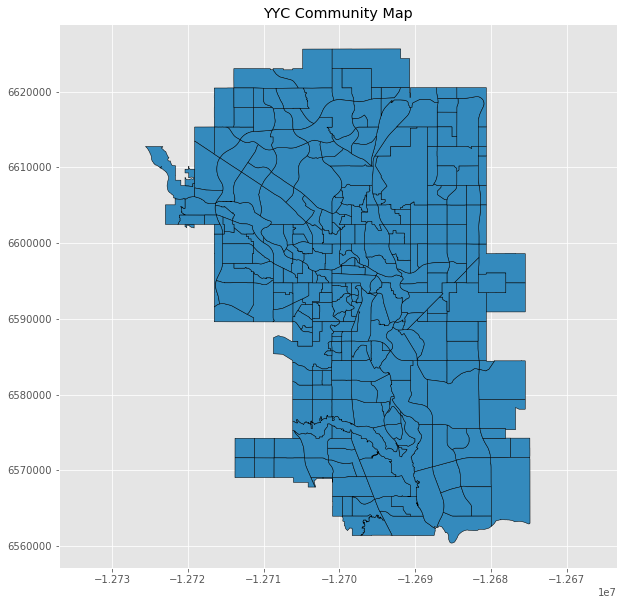

In [10]:
# To visualize all the geometric entities, we can use the built-in plot command

fig = plt.figure()
axis = fig.add_subplot(1,1,1)

## The following can be used to control the map projection
## Uncomment the following for Mercator projection
display(cendf.crs)

## Play with projections.
## See http://geopandas.org/projections.html for details

#cendf = cendf.to_crs(epsg=4326) # for lat/long
cendf = cendf.to_crs(epsg=3395) # for mercator

cendf.plot(ax=axis, edgecolor='black')
# can also specify a column to plot

plt.axis('equal')
plt.title('YYC Community Map')
fig.set_size_inches(10,10)




count      306.000000
mean      4193.388889
std       5046.790123
min          0.000000
25%          0.000000
50%       2363.000000
75%       6897.250000
max      25710.000000
Name: res_cnt, dtype: float64

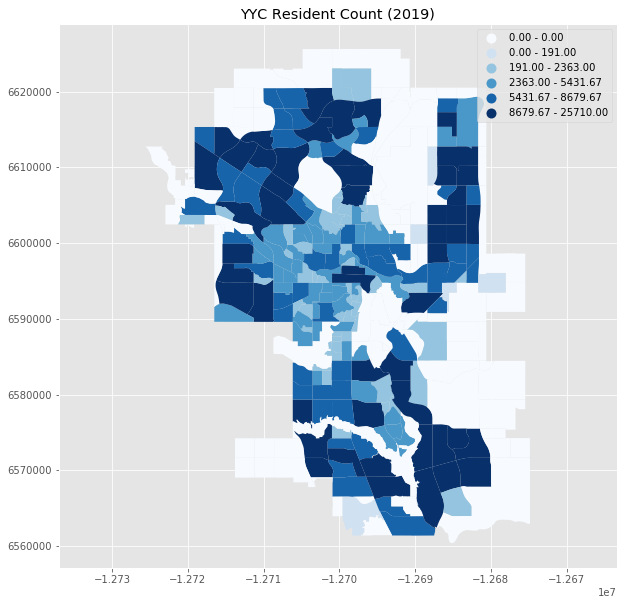

In [26]:
## We may want to colormap the geometric entities according to a property.
## This can be done by specifying a column from the GeoDataFrame.

cendf['res_cnt'] = cendf['res_cnt'].astype(float).astype(int) # convert to an integer
display(cendf['res_cnt'].describe())

fig = plt.figure()
axis = fig.add_subplot(1,1,1)
# The following will split the population into five quantiles
cendf.plot(ax=axis, column='res_cnt', scheme='quantiles', k=6, cmap='Blues', legend=True) 
plt.axis('equal')

plt.title('YYC Resident Count (2019)')
fig.set_size_inches(10,10)



In [47]:
## We can also perform a scatterplot on a map.
## Let's display the rain channels from the Rainfall dataset.

## But first a bit of wrangling to extract the lat / long

rain_location_file = "./Rain_Gauge_locations.csv"
clocs = pd.read_csv(rain_location_file,usecols=["CHANNEL", "Northing", "Easting"])
clocs.set_index('CHANNEL', inplace=True)
clocs.drop_duplicates(inplace=True)
clocs.sort_index(inplace=True)
clocs['Northing'] = clocs['Northing'].astype(float)
clocs['Easting'] = clocs['Easting'].astype(float)
clocs.drop(47, inplace=True)
display(clocs)

,Northing,Easting
CHANNEL,,
1,51.154829,-114.186658
2,51.115345,-114.203118
3,51.126079,-114.150283
4,51.084351,-114.180245
5,51.081650,-114.140011
6,51.115554,-114.068038
7,51.076207,-114.071355
8,51.068572,-114.042270
9,51.091569,-113.957676


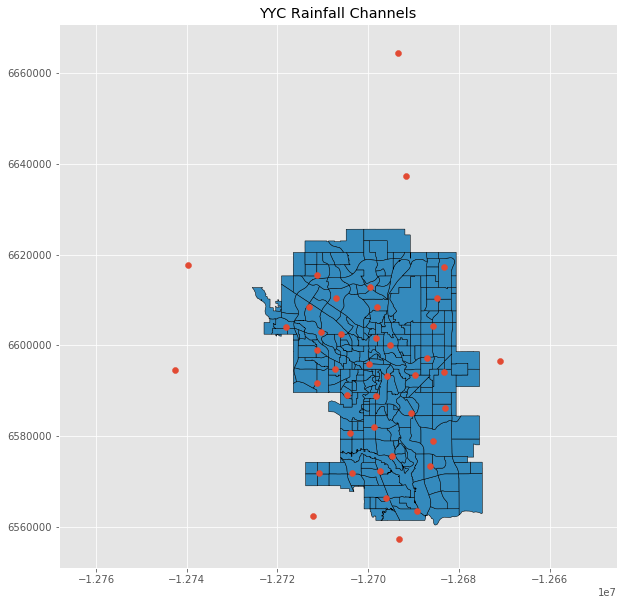

In [49]:
# Now build a GeoDataFrame and plot it over the base map of Calgary communities

from shapely.geometry import Point

clocs['coordinates'] = list(zip(clocs.Easting, clocs.Northing))
clocs['coordinates'] = clocs['coordinates'].apply(Point)
locsdf = gpd.GeoDataFrame(clocs, geometry='coordinates')
locsdf.crs = {'init' :'epsg:4326'} # interpret the coordinates as lat/long

fig = plt.figure()
axis = fig.add_subplot(1,1,1)

# set the projection 
cendf = cendf.to_crs(epsg=3395) #3395 for mercator
locsdf = locsdf.to_crs(epsg=3395) 

cendf.plot(ax=axis, edgecolor='black')
locsdf.plot(ax=axis) 

plt.axis('equal')
plt.title('YYC Rainfall Channels')
fig.set_size_inches(10,10)

## Geo-Visualization in Plotly

- Plotly can do highly interactive choropleth maps for the US and the World. Geometry is implicitly specified via location codes. Currently. there is no integration with `geopandas`. 


- We can send our own geometry to plotly in GeoJSON format. Thankfully, `geopandas` provides helper routines to convert geometry into this format.

- Plotly relies on mapbox to handle GeoJSON data. A mapbox access token may be required for this. Consult plotly [maps](https://plot.ly/python/maps/) tutorials for more details.  

In [56]:
## US choropleth map via plotly express
# From: https://plot.ly/python/choropleth-maps/#united-states-choropleth-map

import plotly.express as px

gapminder = px.data.gapminder().query("year==2007")
fig = px.choropleth(gapminder, locations="iso_alpha",
                    color="lifeExp", # lifeExp is a column of gapminder
                    hover_name="country", # column to add to hover information
                    color_continuous_scale=px.colors.sequential.Plasma)
fig.show()

In [67]:
# Interactive geo-vis on a mapbox base map using plotly

try:
    file = open('mapbox.token', 'r')
    for line in file:
        token = line.rstrip() # Use rstrip to get EOL-free lines
    file.close()
except FileNotFoundError as fnfe:
    print(fnfe)

data = [
    go.Scattermapbox(
        lat=clocs.Northing,
        lon=clocs.Easting,
        mode='markers',
        marker=dict(
            size=9
        ),
        text=clocs.index.tolist(),
    )
]

# Try altering styles to one of: streets, light, dark, outdoors, satellite

layout = go.Layout(
    title='YYC Rainfall Channels<br>Use right mouse button to rotate/pitch',
    autosize=True,
    height=1024,
    hovermode='closest',
    mapbox=dict(
        style="streets",
        accesstoken=token,
        bearing=0,
        center=dict(  # These are Calgary coordinates
            lat=51.0486,
            lon=-114.0708
        ),
        pitch=0, # Pitch lets you pitch up or down
        zoom=10
    ),
)

fig = dict(data=data, layout=layout)
py.iplot(fig)
    

In [68]:
## YYC community boundaries on a mapbox base map via plotly.

cendf = cendf.to_crs(epsg=4326)
geoj = cendf.geometry.__geo_interface__;
print(type(geoj))

sources=[{"type": "FeatureCollection", 'features': [feat]} for feat in geoj['features']]

data = [
    go.Scattermapbox(
        lat=['51.0486'],
        lon=['-114.0708'],
        mode='markers',
        text=['Calgary']
    )
]

layout = go.Layout(
    title='YYC community boundaries',
    height=1024,
    autosize=True,
    hovermode='closest',
    mapbox=dict(
        layers=[
            dict(
                sourcetype = 'geojson',
                source = sources[k],
                type = 'fill',
                
                # the color can be modified per region to do choropleth maps
                color = 'rgba(158,202,225,0.2)'
            
            ) for k in range(len(sources))
        ],
        accesstoken=token,
        bearing=0,
        center=dict(
            lat=51.0486,
            lon=-114.0708
        ),
        pitch=0,
        zoom=10,
        style='light'
    ),
)

fig = dict(data=data, layout=layout)
py.iplot(fig)


<class 'dict'>
